# HOMEWORK 9

In this homework, you are going to use the dlib face detector and apply it to an image of your liking. You can follow the procedure shown in lesson 9. Please always comment your code so I can see what you're doing :-)

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

### Step 0

Run the necessary imports.

In [3]:
import dlib

### Step 1

Load an image (any image that contains faces).

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [15, 10]
source = cv2.imread('data/1.jpg')
source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)

### Step 2

Load the dlib face predictor.

In [5]:
detector = dlib.get_frontal_face_detector()

### Step 3

Run the predictor on your image.

In [7]:
rects = detector(source, 1)
print('Number of detected faces:', len(rects))
print(rects)
print(rects[0].left)

Number of detected faces: 1
rectangles[[(242, 77) (428, 263)]]
<bound method PyCapsule.left of rectangle(242,77,428,263)>


### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

242 77 186 186


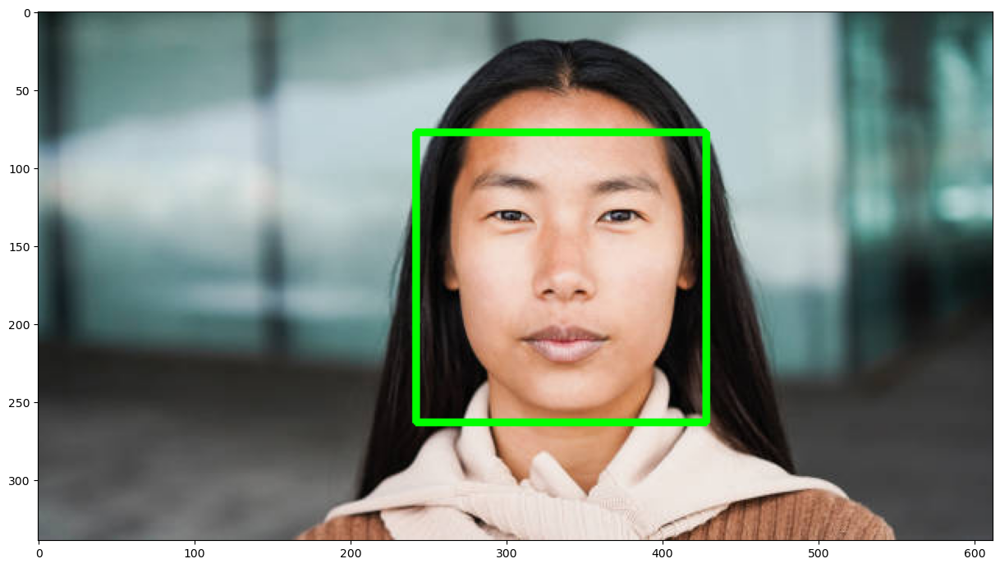

In [9]:
def rect_to_bb(rect):
    # Dlib rect --> OpenCV rect
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y

    return (x, y, w, h)

result_dlib = np.copy(source)
faces_dlib_img = []
for rect in rects:    
    # Draw rectangle around the face
    x, y, w, h = rect_to_bb(rect)
    print(x, y, w, h)
    cv2.rectangle(result_dlib, (x, y), (x+w, y+h), (0, 255, 0), 3)
    faces_dlib_img.append(source[y:y+h, x:x+w, :])
    


plt.imshow(result_dlib)

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

In [13]:
def rect_to_bb(rect):
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y
    return (x, y, w, h)

def detect_faces(image_path):
    # load 
    source = cv2.imread(image_path)
    source = cv2.cvtColor(source, cv2.COLOR_BGR2RGB)

#   set detector
    detector = dlib.get_frontal_face_detector()

    rects = detector(source, 1)
    print('Number of detected faces:', len(rects))
    
# final result img
    result_dlib = np.copy(source)
    
# generate colors
    colors = [(np.random.randint(0, 255), np.random.randint(0, 255), np.random.randint(0, 255)) for _ in range(len(rects))]

    for i, rect in enumerate(rects):    
        x, y, w, h = rect_to_bb(rect)
        cv2.rectangle(result_dlib, (x, y), (x+w, y+h), colors[i], 3)

 
    plt.imshow(result_dlib)
    plt.show()


UsageError: Line magic function `%%time` not found.


Number of detected faces: 1


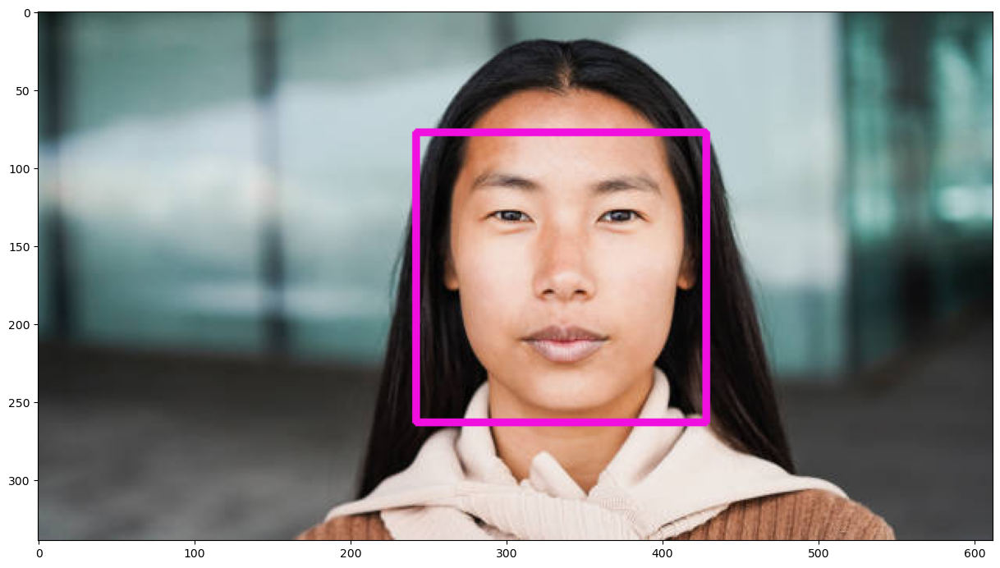

In [28]:
detect_faces('data/1.jpg')

Number of detected faces: 1


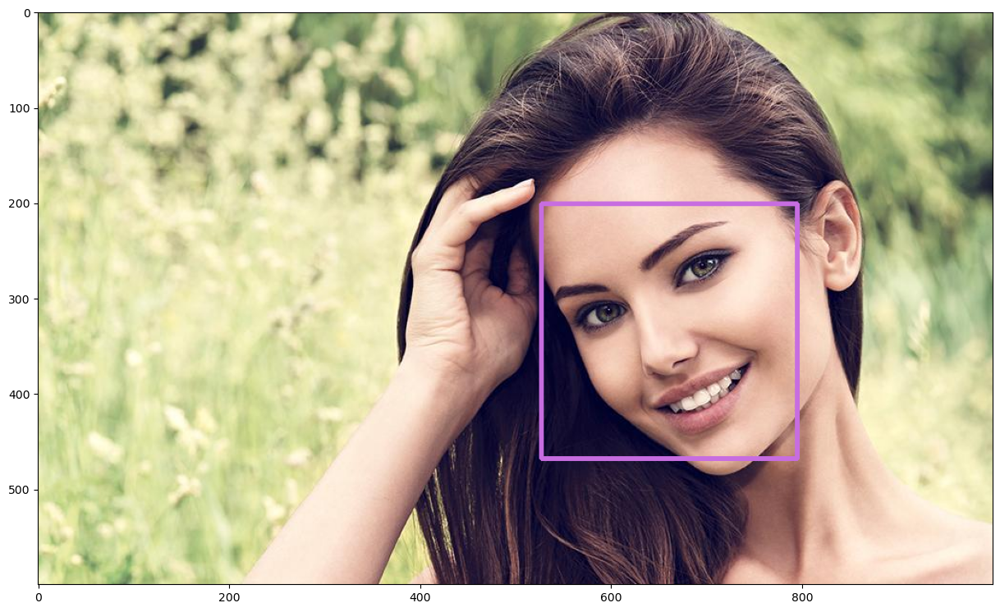

In [29]:
detect_faces('data/2.jpg')

Number of detected faces: 1


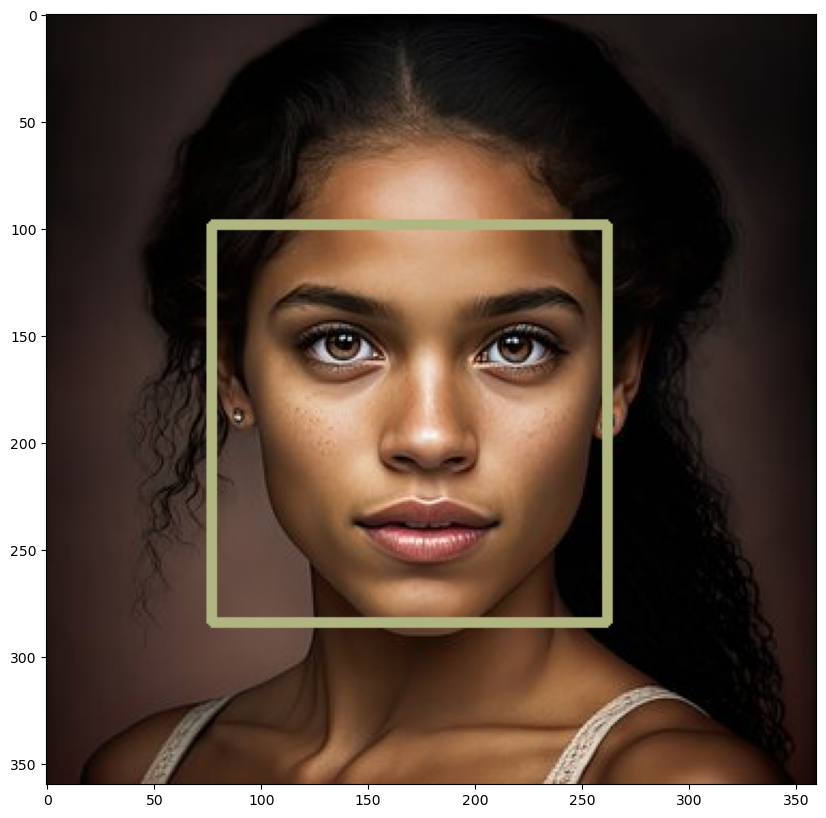

In [30]:
detect_faces('data/3.jpg')

Number of detected faces: 1


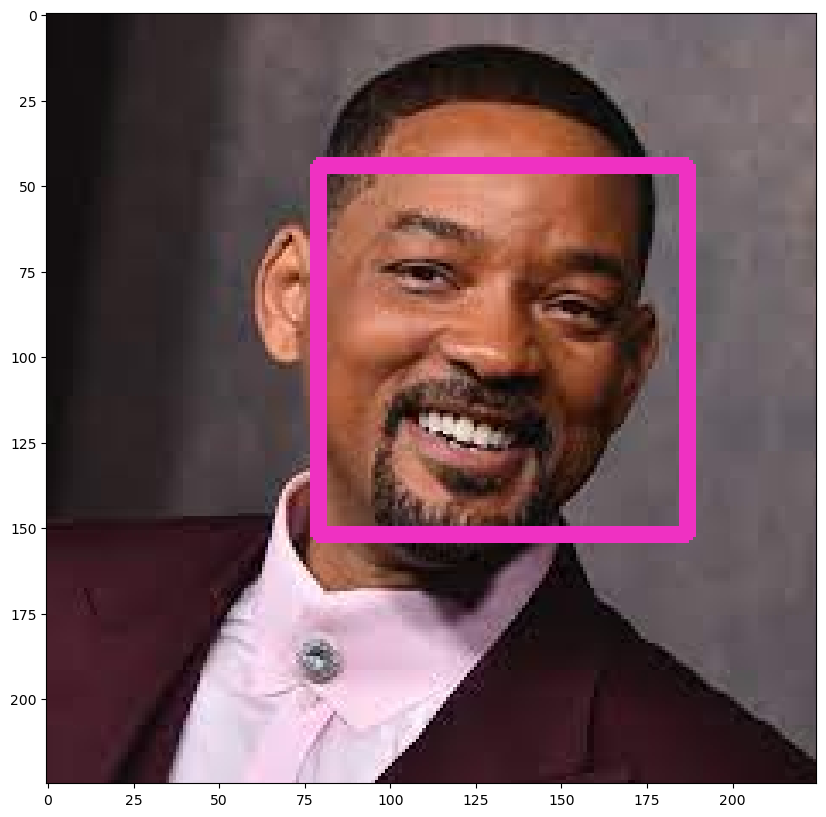

In [31]:
detect_faces('data/4.jpg')

Number of detected faces: 1


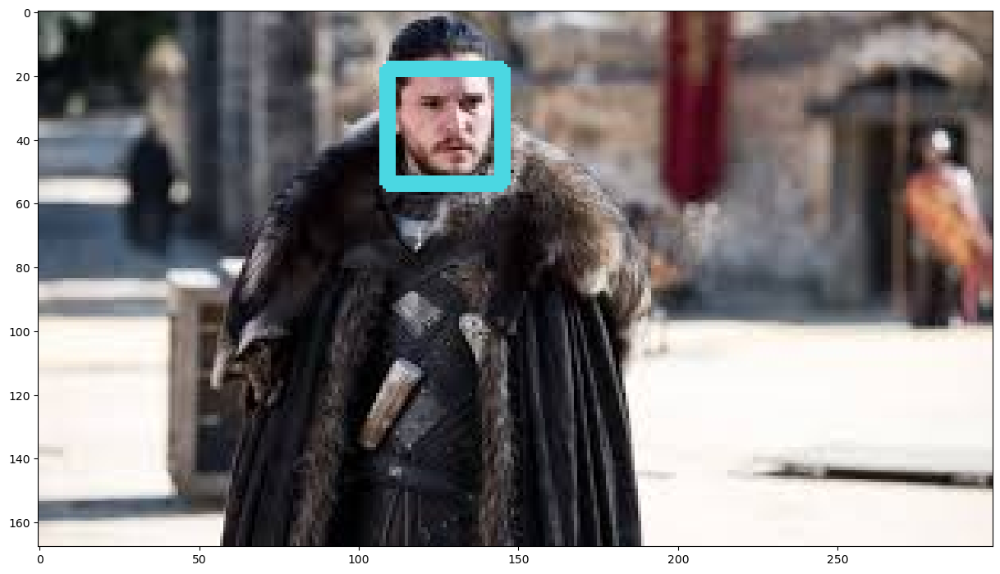

In [32]:
detect_faces('data/5.jpg')

Number of detected faces: 4


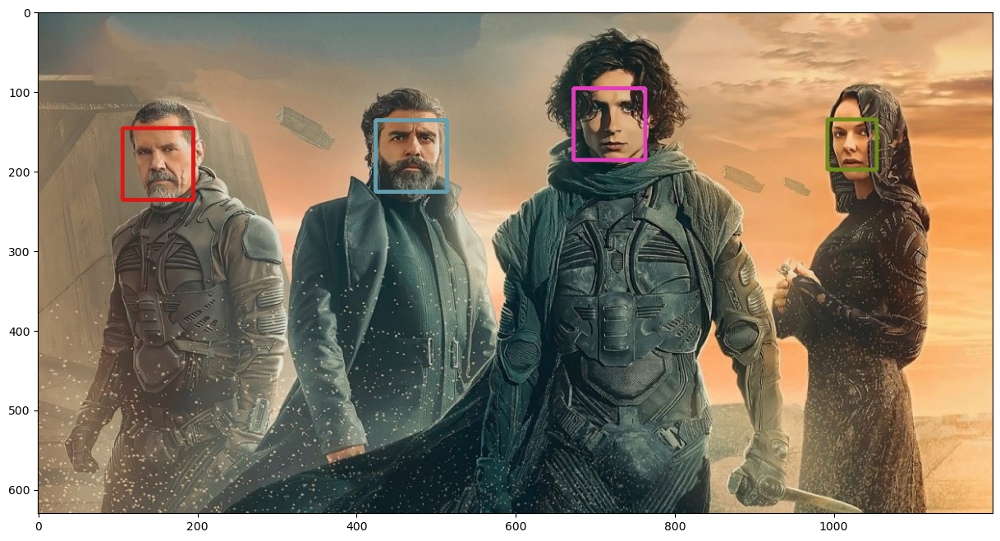

In [33]:
detect_faces('data/6.jpg')

Number of detected faces: 1


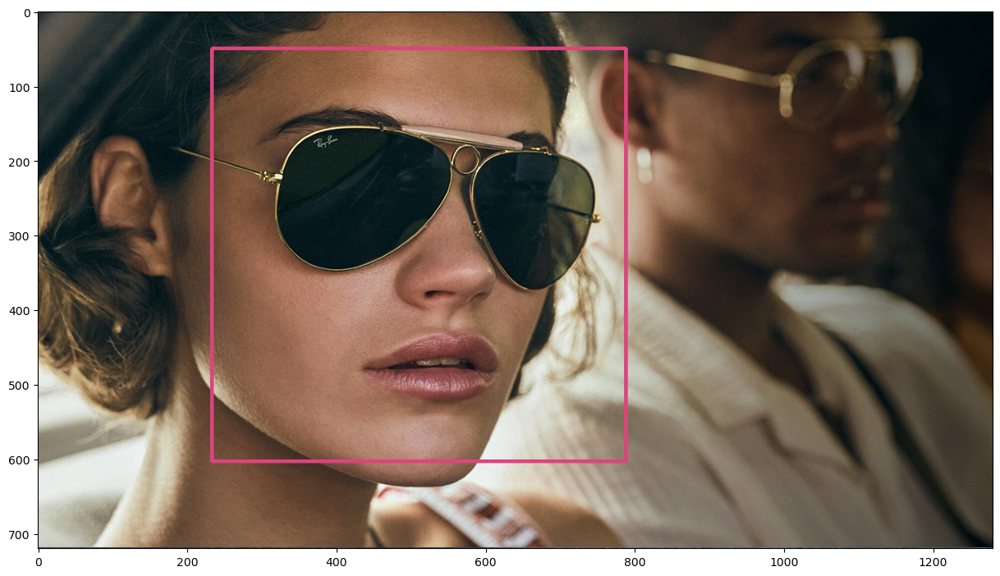

In [34]:
detect_faces('data/7.jpg')

Number of detected faces: 1


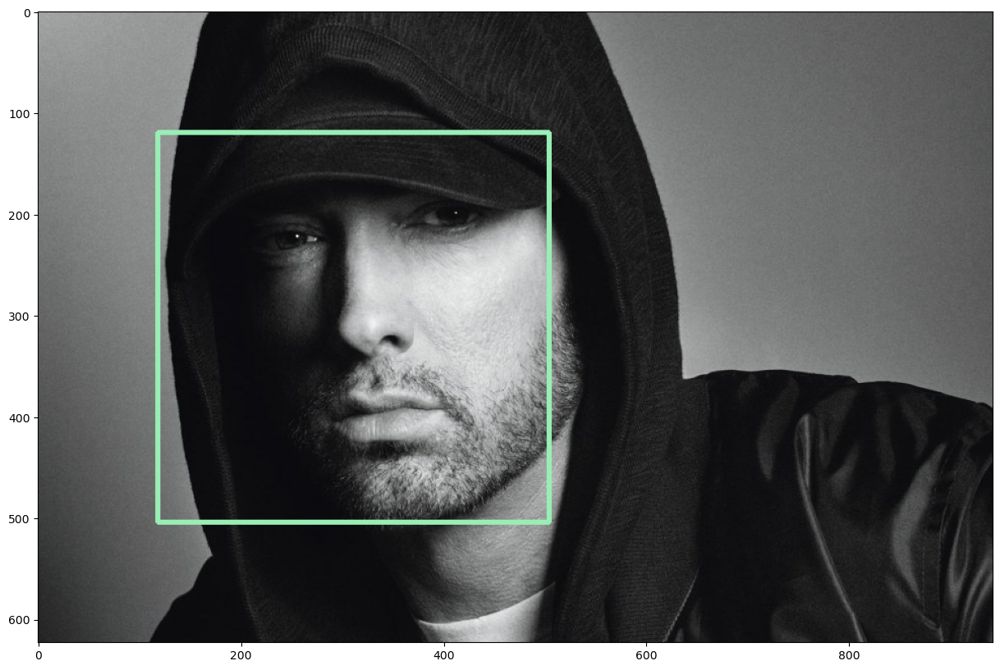

In [35]:
detect_faces('data/8.jpg')

Number of detected faces: 0


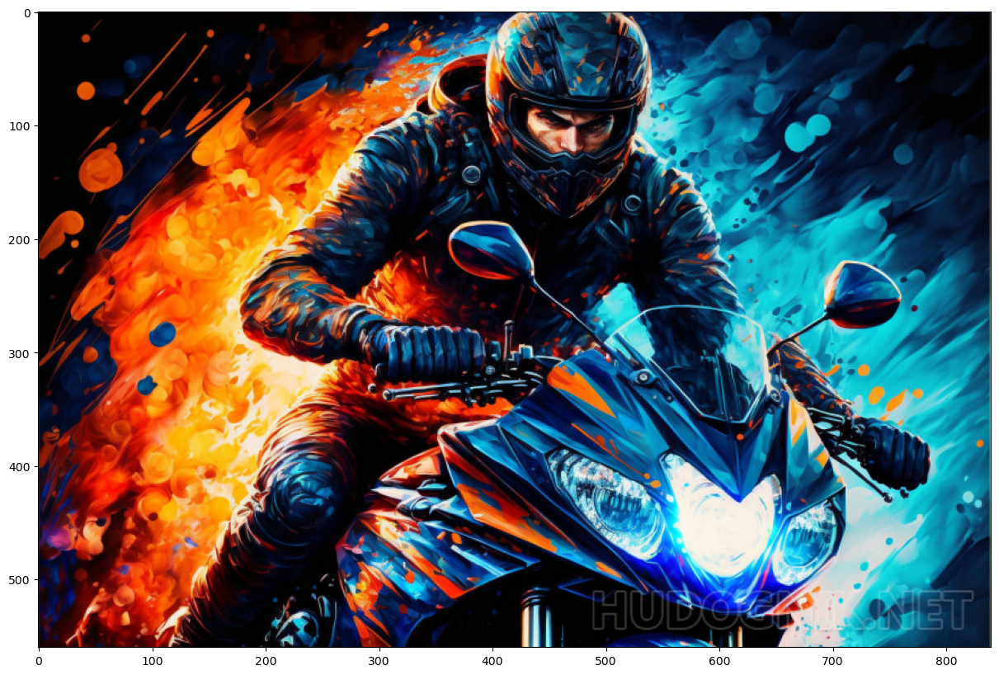

In [36]:
detect_faces('data/9.jpg')

Number of detected faces: 0


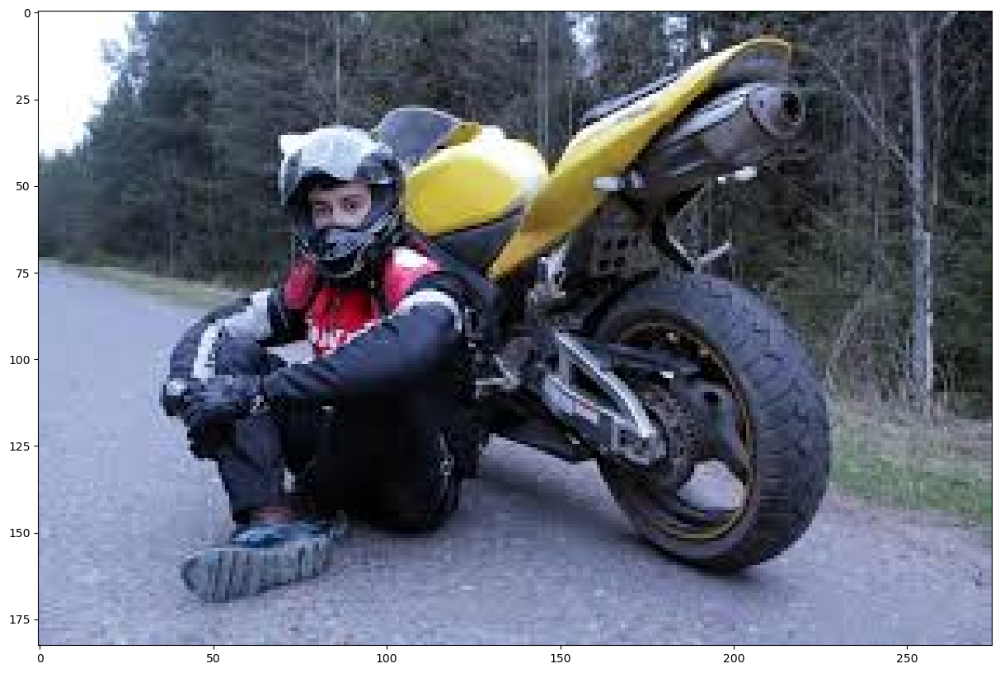

In [37]:
detect_faces('data/10.jpg')

Number of detected faces: 4


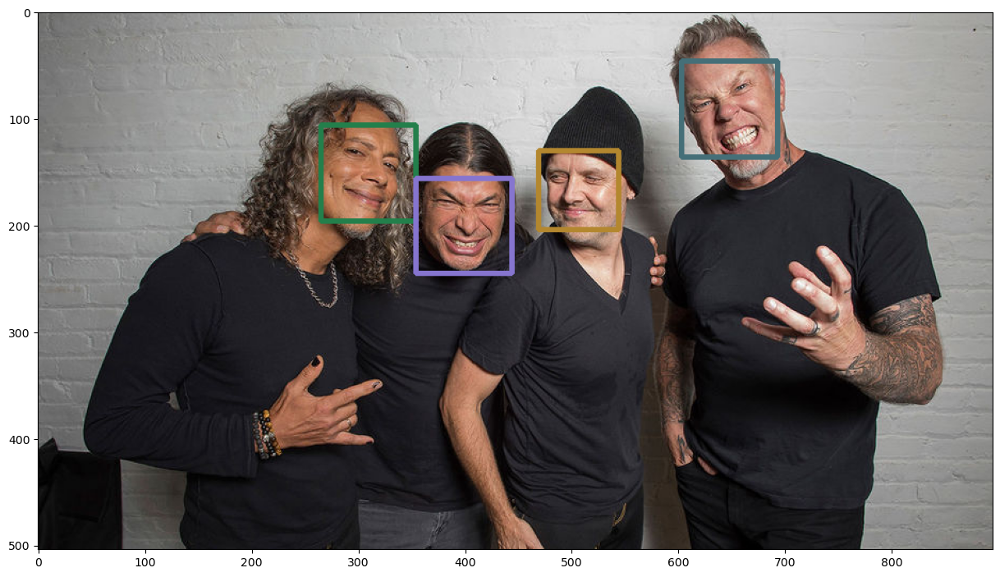

In [40]:
detect_faces('data/11.jpg')

В целом работает неплохо. Единственный случай когда модель не может найти лицо это мотоцилкисты